In [ ]:
!pip install pretrainedmodels

     |████████████████████████████████| 58 kB 2.0 MB/s 
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=3c452a1a96db401910f848c37c72cadb41084a4c1a89235cb6c96aa1ec4c884c
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built pretrainedmodels


In [ ]:
import torch
import torchvision
from torchvision import transforms,models
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from skimage import io

import os

import numpy as np
from PIL import Image
import time
import matplotlib.pyplot as plt
from tqdm import tqdm
import copy
import shutil
import logging


import pretrainedmodels


from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_curve, roc_auc_score
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cuda = torch.cuda.is_available()

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


DataLoader

In [ ]:
def get_loader(data_path,pin_memory=True,num_workers = 8,batch_size = 256):
    """
    Return the dataloader for train,dev and test, along with number of Classes in dataset
    Args:
        pin_memory: (bool) speed up host to device transfer(load samples on CPU push to GPU on training)
        number_workers: (int) multi-process data loading
        batch_size: (int) load data in batches
    
    Returns:
        dataloaders: (DataLoader) train, test, and dev dataloaders
        num_classses: (int) number of different classes of faces in dataset
    """
    transform = transforms.Compose([transforms.Resize(256),
                                    transforms.CenterCrop(224),
                                    transforms.ToTensor(),##Add more data Augumentation(Select data augumentation -> None or other options like horizontal flip crop)
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),])
    # Train Dataset
    train_dataset = torchvision.datasets.ImageFolder(root=data_path+'train/', 
                                                 transform = transform)
    
    # Dev Dataset                                             
    dev_dataset = torchvision.datasets.ImageFolder(root=data_path+'val/', 
                                               transform = transform)
    # Test Dataset
    test_dataset = torchvision.datasets.ImageFolder(root=data_path+'test/', 
                                               transform = transform)
    
    #Trainloader
    train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, 
                                               shuffle=True, num_workers=num_workers,pin_memory=True)

    
    # Dev Loader
    dev_dataloader = torch.utils.data.DataLoader(dev_dataset, batch_size=batch_size, 
                                             shuffle=True, num_workers=num_workers, pin_memory=True)

    # Test Loader
    test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=10, 
                                             shuffle=False, num_workers=num_workers, pin_memory=True)
    
    return train_dataloader, dev_dataloader,test_dataloader, len(train_dataset.classes)   



Loss Function 

In [ ]:
def cross_entropy(output, labels):
    """
    Loss for Classification
    Args:
        output: (Tensor) Tensor of Prediction made by the model for face class
        labels: (Tensor) True labels for each batch of faces
    """
    return F.cross_entropy(output, labels)

In [ ]:
class RunningAverage():
    """A simple class that maintains the running average of a quantity
    
    Example:
    ```
    loss_avg = RunningAverage()
    loss_avg.update(2)
    loss_avg.update(4)
    loss_avg() = 3
    ```
    """
    def __init__(self):
        self.steps = 0
        self.total = 0
    
    def update(self, val):
        self.total += val
        self.steps += 1
    
    def __call__(self):
        return self.total/float(self.steps)

In [ ]:
def one_epoch(epoch,net,loader,optimizer):
  net.train()
  running_loss = 0.0
  n = 0
  correct = 0
  total = 0
  loss_avg = RunningAverage()
  with tqdm(total=len(loader)) as t:
    for i,(inputs,labels) in enumerate(loader):
      inputs = inputs.to(device)
      labels = labels.to(device)
      optimizer.zero_grad()
      outputs = net(inputs)
      loss = cross_entropy(outputs,labels)
      running_loss += loss.item()
      loss.backward()
      optimizer.step()
      _, predicted = torch.max(outputs.data, 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()
      torch.cuda.empty_cache()
      loss_avg.update(loss.item())
      del inputs
      del labels
      del loss
      t.set_postfix(loss='{:05.3f}'.format(loss_avg()))
      t.update()
  avg_loss = running_loss / total
  acc = correct / total *100
  return avg_loss,acc

In [ ]:
def infer_classfication(net, loader):
    net.eval()
    running_loss = 0.0
    n = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for i, (inputs,labels) in enumerate(loader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = net(inputs)
            loss = cross_entropy(outputs,labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            del inputs
            del labels

    acc = correct / total * 100
    avg_loss = running_loss / total
    return avg_loss, acc

In [ ]:
def save_checkpoint(state, is_best, checkpoint):
    """Saves model and training parameters at checkpoint + 'last.pth.tar'. If is_best==True, also saves
    checkpoint + 'best.pth.tar'
    Args:
        state: (dict) contains model's state_dict, may contain other keys such as epoch, optimizer state_dict
        is_best: (bool) True if it is the best model seen till now
        checkpoint: (string) folder where parameters are to be saved
    """
    filepath = os.path.join(checkpoint, 'last.pth.tar')
    if not os.path.exists(checkpoint):
        print("Checkpoint Directory does not exist! Making directory {}".format(checkpoint))
        os.mkdir(checkpoint)
    else:
        print("Checkpoint Directory exists! ")
    torch.save(state, filepath)
    if is_best:
        shutil.copyfile(filepath, os.path.join(checkpoint, 'best.pth.tar'))

In [ ]:
def load_checkpoint(checkpoint, model, optimizer=None,scheduler=None):
    """Loads model parameters (state_dict) from file_path. If optimizer is provided, loads state_dict of
    optimizer assuming it is present in checkpoint.
    Args:
        checkpoint: (string) filename which needs to be loaded
        model: (torch.nn.Module) model for which the parameters are loaded
        optimizer: (torch.optim) optional: resume optimizer from checkpoint
    """
    if not os.path.exists(checkpoint):
        raise("File doesn't exist {}".format(checkpoint))
    #checkpoint = torch.load(checkpoint)
    checkpoint = torch.load(checkpoint,map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])

    if optimizer:
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        #optimizer2.load_state_dict(checkpoint['optimizer_closs_state_dict'])
    
    if scheduler:
      scheduler.load_state_dict(checkpoint["scheduler_save"])

    return checkpoint

In [ ]:
def train_step(net,loader,dev_loader,optimizer,scheduler,epochs):
  net.train()
  train_losses = []
  valid_losses = []
  valid_acc = []
  auc_acc = []
  
  #Resume Training 
  '''
  checkpoint_path = "/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint/last.pth.tar"
  loaded_checkpoint = load_checkpoint(checkpoint_path,net,optimizer,scheduler)
  train_loss,dev_loss,d_acc = loaded_checkpoint["train_loss"],loaded_checkpoint["dev_loss"], loaded_checkpoint["dev_acc"]
  print('='*20)
  print(train_loss,dev_loss,d_acc)
  print('='*20)
  '''

  best_acc = 0.0
  is_best = False
  for epoch in range(epochs):
    for prarm_group in optimizer.param_groups:
	        print("Current lr: \t{}".format(prarm_group["lr"]))
    avg_loss_t, acc_t = one_epoch(epoch, net, loader, optimizer)

    print(f'\n\n*************\n')
    print('Epoch [%d], loss: %.8f, acc: %.4f' %
                (epoch + 1, avg_loss_t, acc_t))
    avg_loss_v, acc_v = infer_classfication(net, dev_loader)
    valid_losses.append(avg_loss_v)
    valid_acc.append(acc_v)   
    print('[Classification valid] loss: %.8f, acc: %.4f\n\n' % (avg_loss_v, acc_v))
    if acc_v > best_acc:
      is_best = True
    #scheduler.step() # StepLR
    scheduler.step(avg_loss_v) # ReduceonPlateau
    train_losses.append(avg_loss_t)
    print('\n','='*20)
    print("*** Saving Checkpoint ***\n")
    
    save_checkpoint({'epoch': epoch + 1,
                               'model_state_dict': net.state_dict(),
                               'optimizer_state_dict': optimizer.state_dict(),
                                'scheduler_save' : scheduler.state_dict(),
                               'train_loss': train_losses,
                                'dev_loss':valid_losses,
                                'dev_acc': valid_acc,},
                              is_best=is_best,
                              checkpoint = hyper_param["ckpnt_training"]
                              #checkpoint="/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint"
                              )
    
  return train_losses, valid_losses,valid_acc

In [ ]:
def set_logger(log_path):
    """Set the logger to log info in terminal and file `log_path`.
    In general, it is useful to have a logger so that every output to the terminal is saved
    in a permanent file. Here we save it to `model_dir/train.log`.
    Example:
    ```
    logging.info("Starting training...")
    ```
    Args:
        log_path: (string) where to log
    """
    logger = logging.getLogger()
    logger.setLevel(logging.INFO)

    if not logger.handlers:
        # Logging to a file
        file_handler = logging.FileHandler(log_path)
        file_handler.setFormatter(logging.Formatter('%(asctime)s:%(levelname)s: %(message)s'))
        logger.addHandler(file_handler)

        # Logging to console
        stream_handler = logging.StreamHandler()
        stream_handler.setFormatter(logging.Formatter('%(message)s'))
        logger.addHandler(stream_handler)

In [ ]:
def main():
  # Set the logger
  set_logger(os.path.join('/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint', 'train.log'))

  logging.info("Loading the datasets...")
  # fetch dataloaders
  train_dataloader, dev_dataloader,test_dataloader, num_classes = get_loader(hyper_param["data_path"]
                                                                             ,num_workers=hyper_param["num_workers"]
                                                                             ,batch_size = hyper_param["batch_size"])
  logging.info("- done.")
  
  logging.info("Loading the Pretrained Resnet18 Model for Transfer Learning")
  #Model based on Resnet18(Transfer Learning)
  model_name = 'nasnetalarge' # could be fbresnet152 or inceptionresnetv2
  tl_resnet50 = pretrainedmodels.__dict__[model_name](num_classes=1000, pretrained='imagenet')
  #tl_resnet50 = models.wide_resnet101_2(pretrained=True)
  print(tl_resnet50)
  logging.info("- done.")
  #Freeze the wait to covert from fine tuining TL to fixed feature extractor
  
  for param in tl_resnet50.parameters():
    param.requires_grad = False
  

  num_ftrs = tl_resnet50.last_linear.in_features
  tl_resnet50.last_linear = nn.Linear(num_ftrs, 2)
  tl_resnet50.to(device)

  Adam_optimizer = torch.optim.Adam(tl_resnet50.parameters(),lr = hyper_param["lr"])
  scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(Adam_optimizer,mode='min',patience=1)
  #scheduler = None
  
  '''
  checkpoint_path =hyper_param['ckpnt_training']+'/last.pth.tar'
  #checkpoint_path = "/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint/last.pth.tar"
  loaded_checkpoint = load_checkpoint(checkpoint_path,tl_resnet50,Adam_optimizer,scheduler)
  train_loss,dev_loss,d_acc = loaded_checkpoint["train_loss"],loaded_checkpoint["dev_loss"], loaded_checkpoint["dev_acc"]
  print('='*20)
  print(train_loss,dev_loss,d_acc)
  print('='*20)
  '''
  
  logging.info(f"Starting training for {hyper_param['numEpochs']} epoch(s)")
  train_losses, valid_losses, valid_acc = train_step(tl_resnet50, train_dataloader, dev_dataloader,Adam_optimizer,scheduler,hyper_param["numEpochs"])

In [ ]:
if __name__ == "__main__":
  hyper_param = {
    "lr": 1e-2,
    "batch_size": 128,
    "numEpochs": 30, 
    "num_workers": 0,
    "ckpnt_training": "/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint2",
    "checkpoint":"/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint/last.pth.tar",
    "data_path":"/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/data/images_handheld/"
  }
  main()

Loading the datasets...
- done.
Loading the Pretrained Resnet18 Model for Transfer Learning
Downloading: "http://data.lip6.fr/cadene/pretrainedmodels/nasnetalarge-a1897284.pth" to /root/.cache/torch/hub/checkpoints/nasnetalarge-a1897284.pth


  0%|          | 0.00/340M [00:00<?, ?B/s]

- done.


NASNetALarge(
  (conv0): Sequential(
    (conv): Conv2d(3, 96, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(96, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (cell_stem_0): CellStem0(
    (conv_1x1): Sequential(
      (relu): ReLU()
      (conv): Conv2d(96, 42, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(42, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (comb_iter_0_left): BranchSeparables(
      (relu): ReLU()
      (separable_1): SeparableConv2d(
        (depthwise_conv2d): Conv2d(42, 42, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), groups=42, bias=False)
        (pointwise_conv2d): Conv2d(42, 42, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (bn_sep_1): BatchNorm2d(42, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU()
      (separable_2): SeparableConv2d(
        (depthwise_conv2d): Conv2d(42, 42, kernel_size=(5, 5), stride=(

Starting training for 30 epoch(s)


Current lr: 	0.01


  0%|          | 0/10 [01:27<?, ?it/s]


RuntimeError: ignored

In [ ]:
tl_resnet50 = models.resnet50(pretrained=True)
num_ftrs = tl_resnet50.fc.in_features
tl_resnet50.fc = nn.Linear(num_ftrs, 2)
tl_resnet50.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
checkpoint_path = "/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint/best.pth.tar"
checkpoint_infer = load_checkpoint(checkpoint_path,tl_resnet50,None,None)

In [ ]:
hyper_param = {
    "lr": 1e-2,
    "batch_size": 128,
    "numEpochs": 10, 
    "num_workers": 0,
    "checkpoint":"/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/checkpoint/last.pth.tar",
    "data_path":"/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/data/images_handheld/"
  }
train_dataloader, dev_dataloader,test_dataloader, num_classes = get_loader(hyper_param["data_path"]
                                                                             ,num_workers=hyper_param["num_workers"]
                                                                             ,batch_size = hyper_param["batch_size"])

In [ ]:
avg_loss_test, acc_test = infer_classfication(tl_resnet50,test_dataloader)
print(f"*** Classifier <-> Feature Extractor\n [Test] Loss:{avg_loss_test} \t Accuracy:{acc_test} ")

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


*** Classifier <-> Feature Extractor
 [Test] Loss:0.0368791049128616 	 Accuracy:85.71428571428571 


Learning Curve

In [ ]:
train_loss,dev_loss,d_acc = checkpoint_infer["train_loss"],checkpoint_infer["dev_loss"], checkpoint_infer["dev_acc"]
plt.figure(figsize=(10, 6))
plt.plot( train_loss,"r-+", linewidth=3, label="Training loss")
plt.plot(dev_loss, "b-", linewidth=2, label="Dev loss")
plt.legend(loc="best", fontsize=14)   
plt.xlabel("Epochs", fontsize=14) 
plt.ylabel("Loss", fontsize=14) 
plt.title("Learning Curve")
plt.show()

In [ ]:
def pred_analysis(model, loader):
    model.eval()
    prediction = np.array([])
    true = np.array([])
    with torch.no_grad():
        for batch_idx, (imgs, targets) in enumerate(loader):
            imgs, targets = imgs.float().to(device), targets.float().to(device)
            outputs = model(imgs)
            _, predicted = torch.max(outputs.data, 1)
            prediction = np.concatenate((prediction, predicted.cpu().numpy().reshape(-1)))
            true = np.concatenate((true, targets.cpu().numpy().reshape(-1)))
            del imgs
            del targets
    return prediction, true

In [ ]:
# Calculate simliarity score
pred, true = pred_analysis(tl_resnet50, test_dataloader)

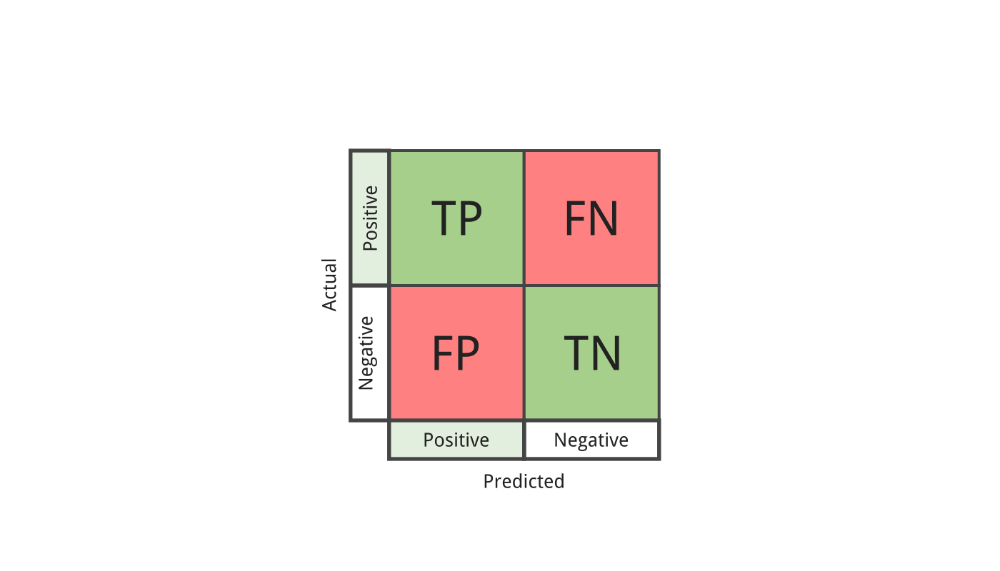

In [ ]:
print(f'Confusion_matrix:\n{confusion_matrix(true, pred)}')
auc = roc_auc_score(true, pred)
print(f'AUC Score: {auc}\n')
precision = precision_score(true, pred) 
print("Precision = %f" % precision)

recall = recall_score(true, pred)
print("Recall = %f" % recall)


f1 = f1_score(true, pred)
print("F1 Score = %f" % f1)

Confusion_matrix:
[[64 13]
 [ 9 68]]
AUC Score: 0.8571428571428571

Precision = 0.839506
Recall = 0.883117
F1 Score = 0.860759


<class 'PIL.MpoImagePlugin.MpoImageFile'>


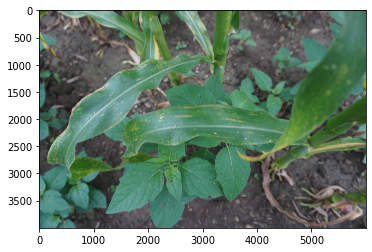

In [ ]:
from skimage import io 
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

import os
root_path = '/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/data/images_handheld/test/0/DSC00134.JPG'
image = io.imread(os.path.join(root_path))
image2 = Image.open(root_path)
transform = transforms.Compose([
  transforms.Resize(256),
  transforms.CenterCrop(224),
  #transforms.ToTensor(),
  #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
image = transform(image2)
print(type(image2))
#print(image2.shape)
image.save('test.jpg')
plt.imshow(image2)
plt.show()

In [ ]:
def predict_img(fiename,model = tl_resnet50):
  root_path = '/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/data/images_handheld/'
  image = io.imread(os.path.join(root_path,filename))
  print(image.shape)
  plt.imshow(image)
  plt.show()

  transform = transforms.Compose([
  transforms.Resize(256),
  transforms.CenterCrop(224),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  image = Image.open(os.path.join(root_path,filename))
  image = transform(image)
  model.eval()
  clss_predic_dic = {1:'Unhealthy',0:'Healthy'}
  with torch.no_grad():
    inputs = image.float().to(device)
    inputs = inputs.view(1,3,224,224)
    print(inputs.shape)
    outputs = model(inputs)
    _, prediction = torch.max(outputs.data, 1)
  return clss_predic_dic[prediction.item()]


DSC06700.JPG
(4000, 6000, 3)


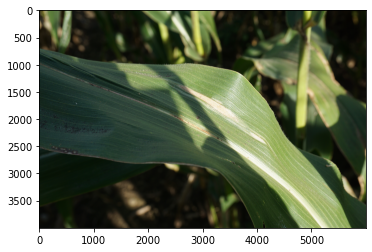

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06699.JPG
(4000, 6000, 3)


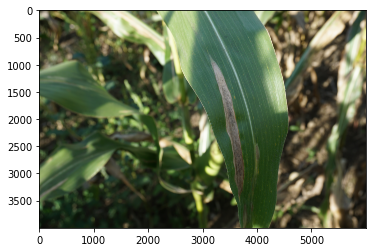

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06698.JPG
(4000, 6000, 3)


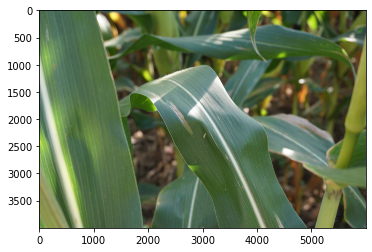

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06701.JPG
(4000, 6000, 3)


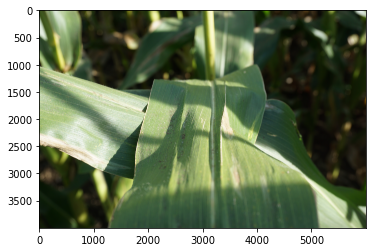

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06704.JPG
(4000, 6000, 3)


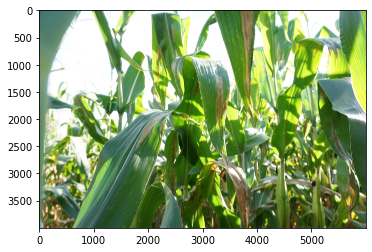

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06703.JPG
(4000, 6000, 3)


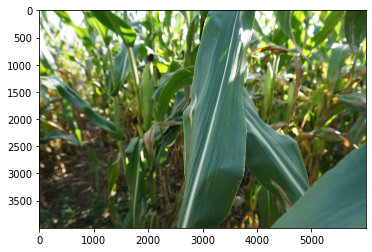

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06705.JPG
(4000, 6000, 3)


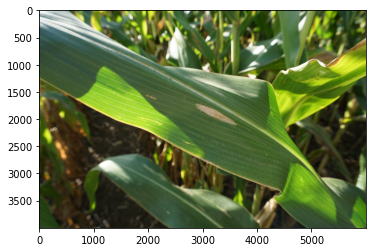

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06835.JPG
(4000, 6000, 3)


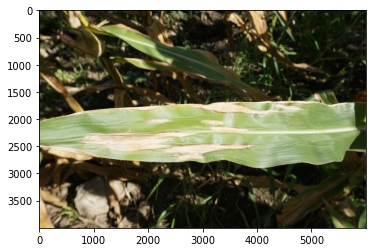

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06842.JPG
(4000, 6000, 3)


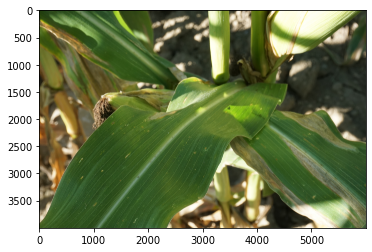

torch.Size([1, 3, 224, 224])
Healthy
DSC06702.JPG
(4000, 6000, 3)


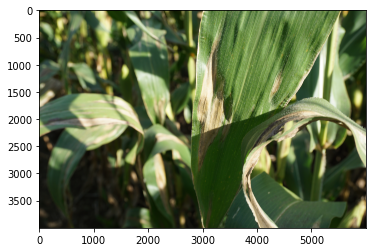

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06843.JPG
(4000, 6000, 3)


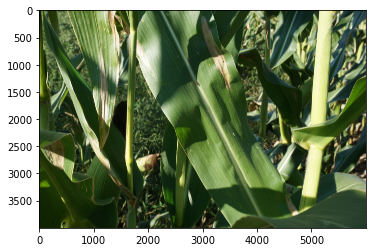

torch.Size([1, 3, 224, 224])
Healthy
DSC06846.JPG
(4000, 6000, 3)


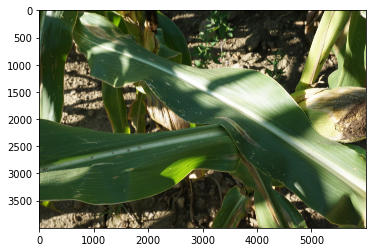

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06845.JPG
(4000, 6000, 3)


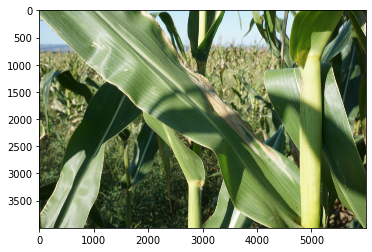

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06844.JPG
(4000, 6000, 3)


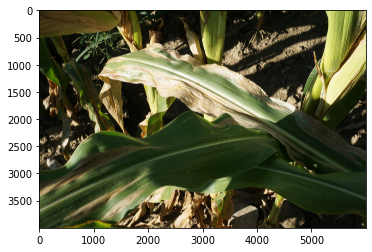

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06848.JPG
(4000, 6000, 3)


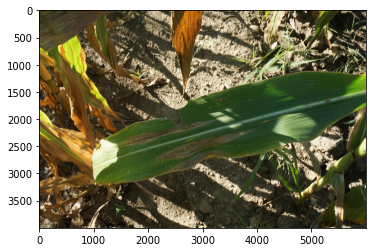

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06847.JPG
(4000, 6000, 3)


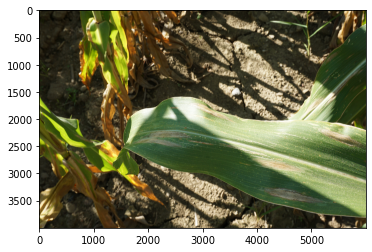

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06853.JPG
(4000, 6000, 3)


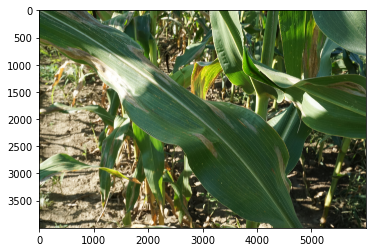

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06852.JPG
(4000, 6000, 3)


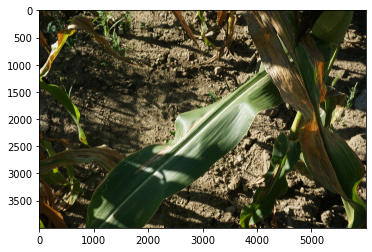

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06851.JPG
(4000, 6000, 3)


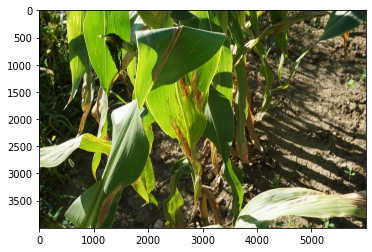

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06855.JPG
(4000, 6000, 3)


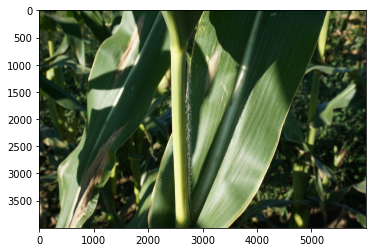

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06850.JPG
(4000, 6000, 3)


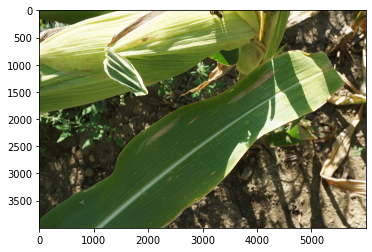

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06854.JPG
(4000, 6000, 3)


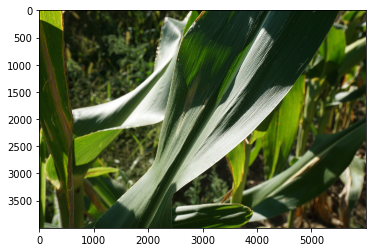

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06849.JPG
(4000, 6000, 3)


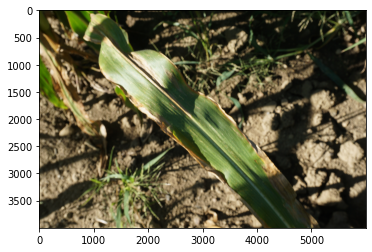

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06857.JPG
(4000, 6000, 3)


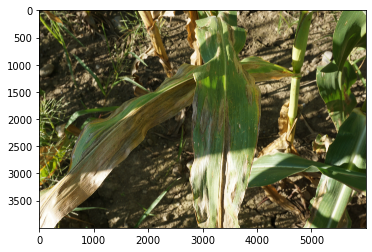

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06860.JPG
(4000, 6000, 3)


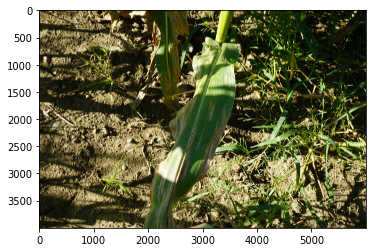

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06856.JPG
(4000, 6000, 3)


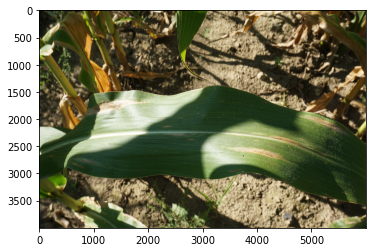

torch.Size([1, 3, 224, 224])
Healthy
DSC06859.JPG
(4000, 6000, 3)


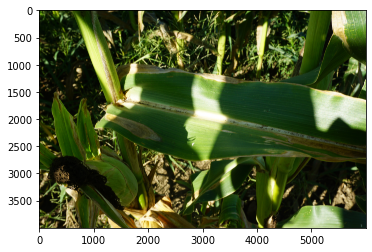

torch.Size([1, 3, 224, 224])
Healthy
DSC06858.JPG
(4000, 6000, 3)


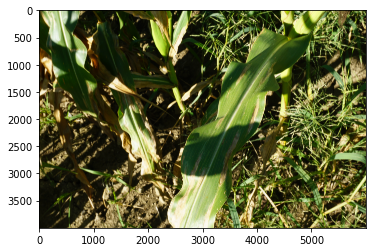

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06861.JPG
(4000, 6000, 3)


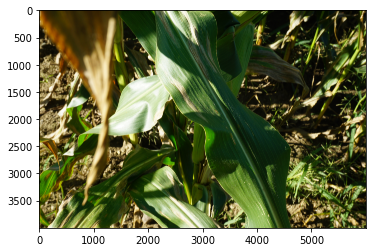

torch.Size([1, 3, 224, 224])
Healthy
DSC06862.JPG
(4000, 6000, 3)


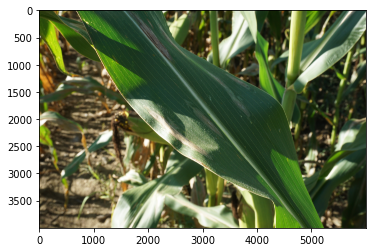

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06863.JPG
(4000, 6000, 3)


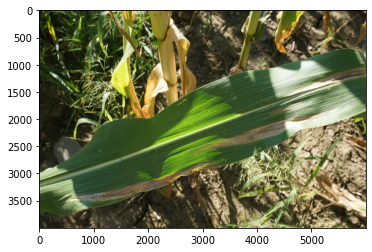

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06867.JPG
(4000, 6000, 3)


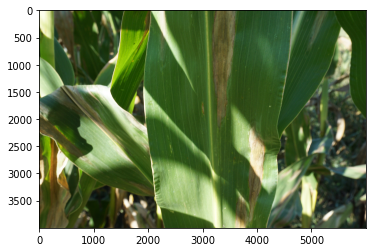

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06866.JPG
(4000, 6000, 3)


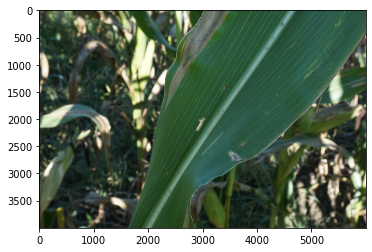

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06864.JPG
(4000, 6000, 3)


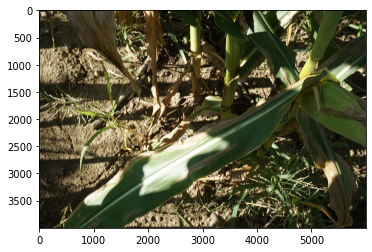

torch.Size([1, 3, 224, 224])
Healthy
DSC06865.JPG
(4000, 6000, 3)


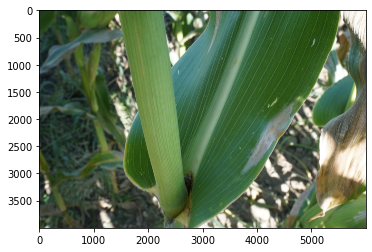

torch.Size([1, 3, 224, 224])
Healthy
DSC06868.JPG
(4000, 6000, 3)


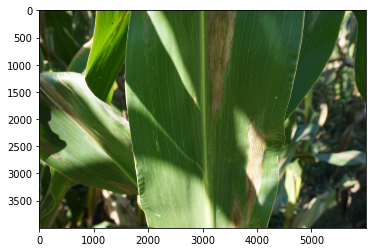

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06873.JPG
(4000, 6000, 3)


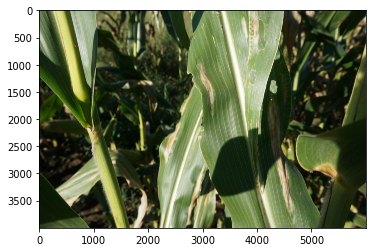

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06872.JPG
(4000, 6000, 3)


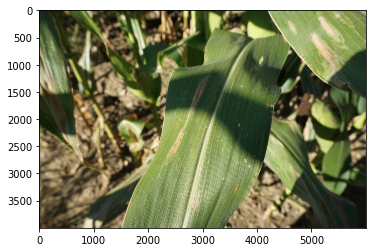

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06871.JPG
(4000, 6000, 3)


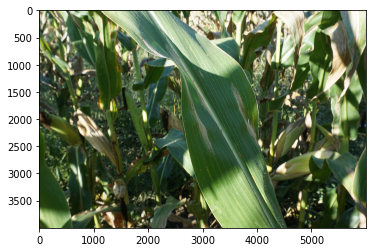

torch.Size([1, 3, 224, 224])
Healthy
DSC06869.JPG
(4000, 6000, 3)


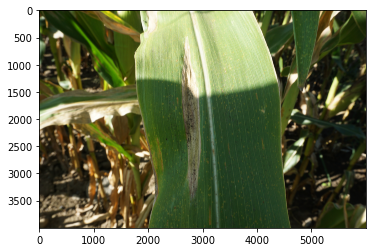

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06870.JPG
(4000, 6000, 3)


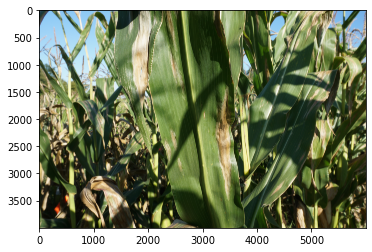

torch.Size([1, 3, 224, 224])
Healthy
DSC06878.JPG
(4000, 6000, 3)


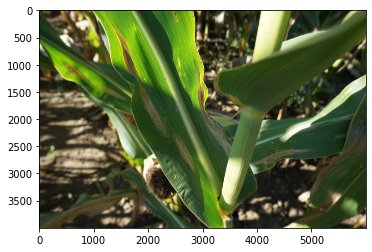

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06875.JPG
(4000, 6000, 3)


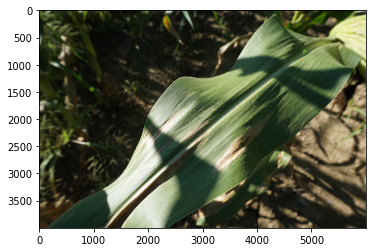

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06874.JPG
(4000, 6000, 3)


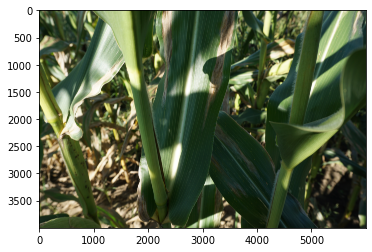

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06877.JPG
(4000, 6000, 3)


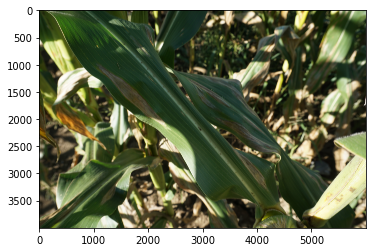

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06880.JPG
(4000, 6000, 3)


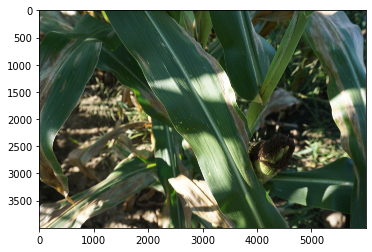

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06879.JPG
(4000, 6000, 3)


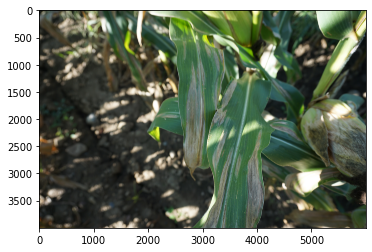

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06876.JPG
(4000, 6000, 3)


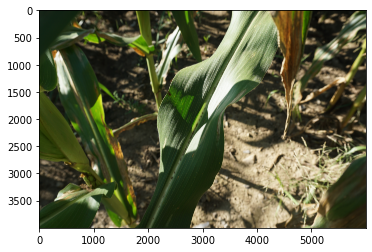

torch.Size([1, 3, 224, 224])
Healthy
DSC06885.JPG
(4000, 6000, 3)


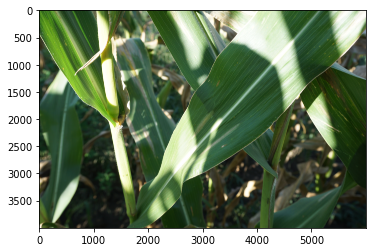

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06887.JPG
(4000, 6000, 3)


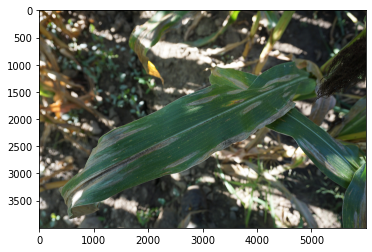

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06886.JPG
(4000, 6000, 3)


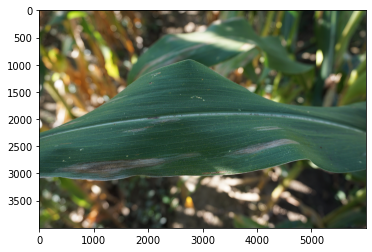

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06881.JPG
(4000, 6000, 3)


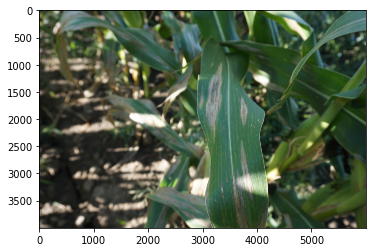

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06884.JPG
(4000, 6000, 3)


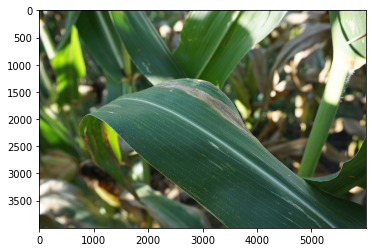

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06882.JPG
(4000, 6000, 3)


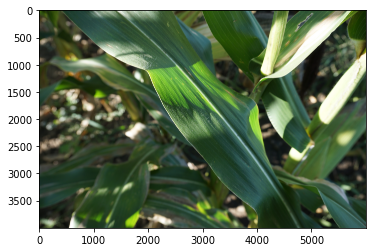

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06883.JPG
(4000, 6000, 3)


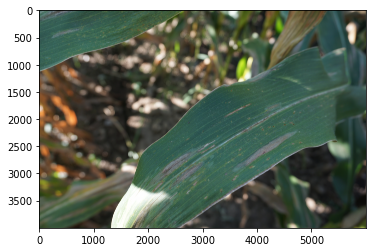

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06895.JPG
(4000, 6000, 3)


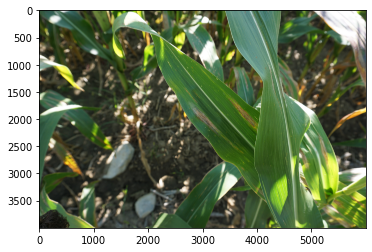

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06889.JPG
(4000, 6000, 3)


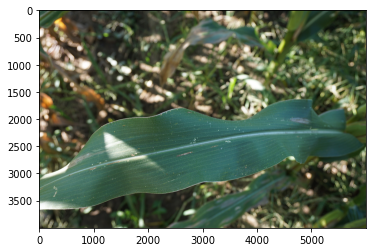

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06888.JPG
(4000, 6000, 3)


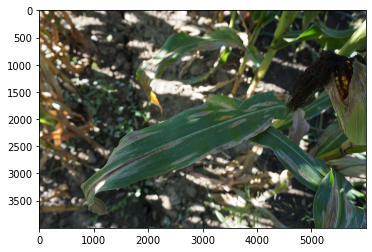

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06894.JPG
(4000, 6000, 3)


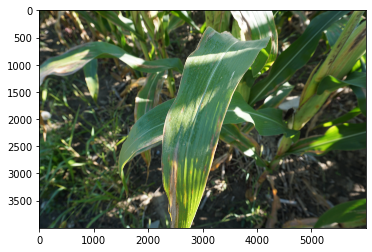

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06892.JPG
(4000, 6000, 3)


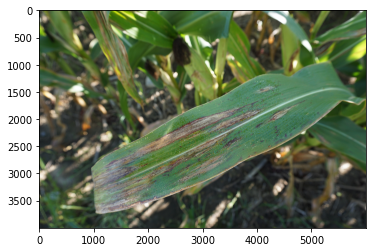

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06893.JPG
(4000, 6000, 3)


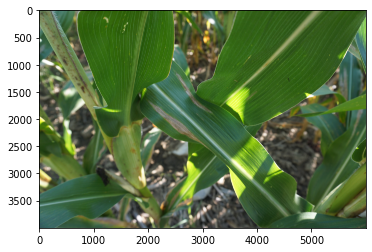

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06890.JPG
(4000, 6000, 3)


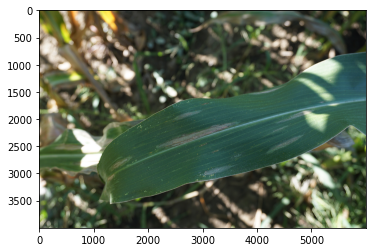

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06891.JPG
(4000, 6000, 3)


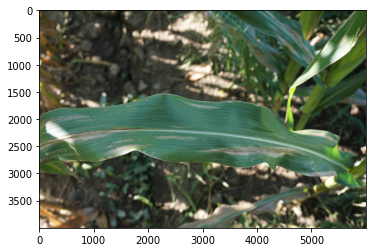

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06903.JPG
(4000, 6000, 3)


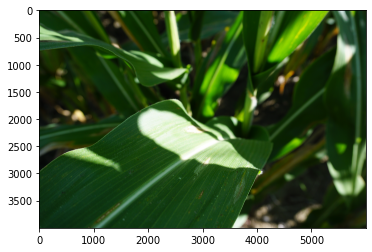

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06898.JPG
(4000, 6000, 3)


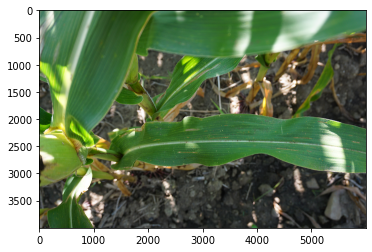

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06899.JPG
(4000, 6000, 3)


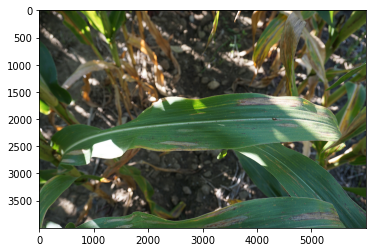

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06897.JPG
(4000, 6000, 3)


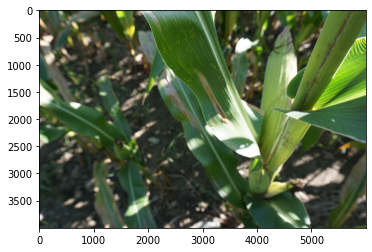

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06896.JPG
(4000, 6000, 3)


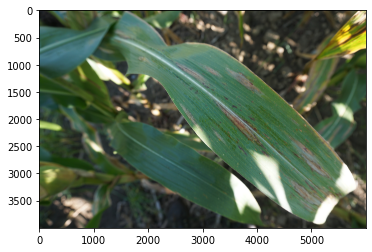

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06901.JPG
(4000, 6000, 3)


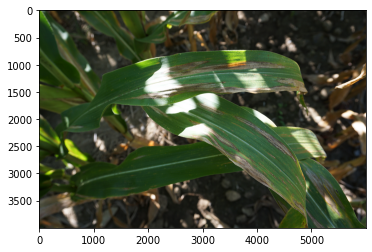

torch.Size([1, 3, 224, 224])
Unhealthy
DSC06902.JPG
(4000, 6000, 3)


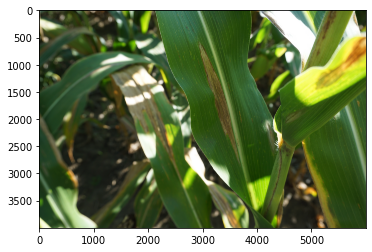

torch.Size([1, 3, 224, 224])
Healthy
DSC06900.JPG
(4000, 6000, 3)


KeyboardInterrupt: ignored

In [ ]:
data_path = '/content/gdrive/MyDrive/capstone/workings/Project_LocalMachine/data/images_handheld'
for root, dirnames, filenames in os.walk(data_path):
  for filename in filenames:
    if filename.endswith(('.JPEG', '.JPG')):
      print(filename)
      print(predict_img(filename))
      

      